# **Lab 2, Part II: Image processing: Color models**  

**This is the second part of Lab 2.**

**You must submit a single lab report covering both Part I and Part II of this lab.**


In this lab, you will explore essential image processing techniques that transform and enhance images, allowing you to extract meaningful insights. These foundational operations serve as building blocks for more advanced computer vision applications.  

### **What you will learn in this Lab:**  
- You will understand the principles behind **geometric transformations and logical operations** in image processing **(Part I)**.  
- You will apply **geometric transformations** such as **resizing, rotation, translation, and perspective modification** to adjust image properties.  
- Explore **color spaces** and how to convert between different color models for advanced image processing **(Part II)**.  

---  




### Understanding the libraries used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: Open Source Computer Vision Library, primarily used for image and video processing tasks such as geometric transformations, filtering, and morphological operations.
  
- **NumPy**: A fundamental package for numerical computing in Python, providing support for arrays, matrices, and mathematical functions used in image processing.
  
- **Matplotlib**: A plotting library for Python that enables visualization of images, histograms, and transformations applied to images.

If not installed, you can install them using:

`pip install opencv-python numpy matplotlib`

In [1]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

# Manipulation 3: Color spaces

Color spaces define how colors are represented in digital images. There are diffrent color spaces **RGB, XYZ,** **L\*** **a\*** **b\***, **HSV**...

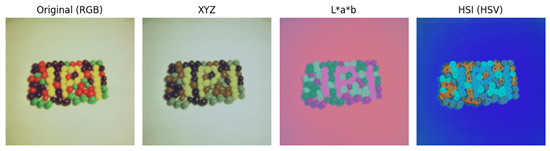

Before diving into coding, let's conduct a **short research** on color spaces.


**Let's consider the folloing color spaces:**

 1. **RGB (Red, Green, Blue)** (Additive: Colors made by mixing light;Primaries: Red, Green, Blue).
 2. **XYZ (CIE 1931)** (Based on how humans see colors i.e., Matches human color vision).
 3. **L\*a*b (CIE Lab)** (Lightness: How light or dark the color is;
Opponent: Colors in two pairs).
 4. **HSV (Hue, Saturation, Value)** (cylindrical color space that represents colors based on their shade (hue), intensity (saturation), and brightness (value),).

**For each color space, answer the following questions:**

1. **Definition**: Describe the color space?  
2. **Components**: What does each channel (e.g. R, G and B for RGB) represent?  
3. **Usage**: What is it commonly used for?  
4. **Advantages & Disadvantages**: What are the benefits and limitations of the color space?


### **Color Spaces Summary**

1. **RGB (Red, Green, Blue)**  
   - **Definition:** Additive color model used in digital displays.  
   - **Components:** R (Red), G (Green), B (Blue).  
   - **Usage:** Screens, cameras, web design, and image processing.  
   - ✅ Easy to use, widely supported.  
   - ❌ Not perceptually uniform, lighting-sensitive.  

2. **XYZ (CIE 1931)**  
   - **Definition:** Color space designed to match human vision.  
   - **Components:** X (Red-Green mix), Y (Brightness), Z (Blue perception).  
   - **Usage:** Color calibration, scientific color measurement.  
   - ✅ Matches human vision well.  
   - ❌ Complex, not intuitive for direct image processing.  

3. **L*a*b (CIE Lab)**  
   - **Definition:** Perceptually uniform color space separating brightness from color.  
   - **Components:** L (Lightness), a (Green-Red), b (Blue-Yellow).  
   - **Usage:** Color correction, segmentation, and printing.  
   - ✅ Good for color-based processing, uniform perception.  
   - ❌ Requires conversion from RGB, not used in displays.  

4. **HSV (Hue, Saturation, Value)**  
   - **Definition:** Cylindrical color space separating hue, intensity, and brightness.  
   - **Components:** H (Color type), S (Intensity), V (Brightness).  
   - **Usage:** Image editing, object detection, segmentation.  
   - ✅ Easy to adjust brightness and color separately.  
   - ❌ Needs conversion from RGB, potential hue wrap-around issues.  


### **Instructions:**  

1. Use the appropriate OpenCV functions to **reproduce the transformations** observed in the output.  
2. Display the transformed images and compare them with the original.

## Task 1 :Exploring RGB Color Space

#### **T 1.1: Channel Extraction**

 **Instructions:**
1. Load the image `sun.bmp`, `After.png` , and `Jellybeans.png` (you can also use other images).
2. Use OpenCV’s `cv2.split() `function to split the image into its Red, Green, and Blue channels.
3. Display each of the individual channels (R, G, B) and grayscale images to observe how each one looks independently.


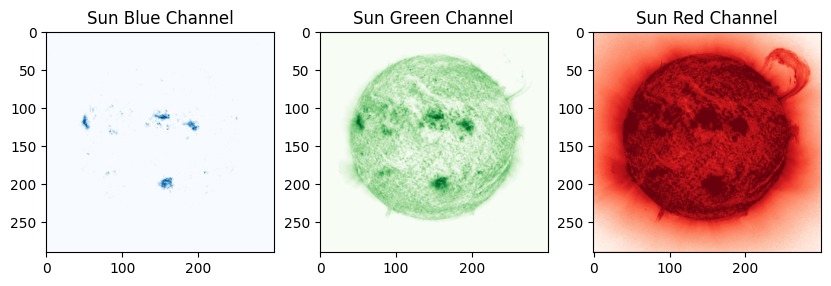

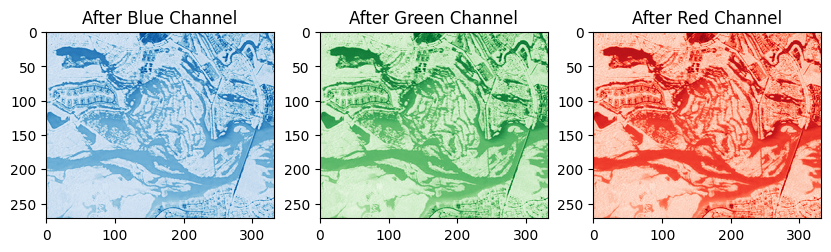

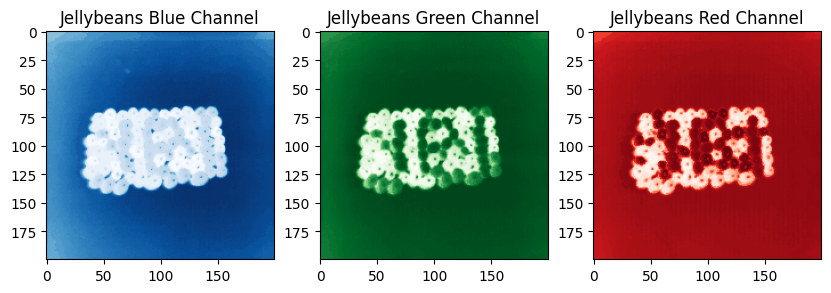

In [34]:
# Apply cv2.split() on the given image pairs using OpenCV.
sun_img = cv.imread('Images/sun.bmp')
after_img = cv.imread('Images/After.png')
jellybeans_img = cv.imread('Images/Jellybeans.png')

# split the image into its channels
sun_b, sun_g, sun_r = cv.split(sun_img)
after_b, after_g, after_r = cv.split(after_img)
jellybeans_b, jellybeans_g, jellybeans_r = cv.split(jellybeans_img)

# Display the images using matplotlib.
plt.figure(figsize=(10, 5))
plt.subplot(1,3,1)
plt.imshow(sun_b , cmap='Blues')
plt.title('Sun Blue Channel')
plt.subplot(1,3,2)
plt.imshow(sun_g, cmap='Greens')
plt.title('Sun Green Channel')
plt.subplot(1,3,3)
plt.imshow(sun_r, cmap='Reds')
plt.title('Sun Red Channel')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1,3,1)
plt.imshow(after_b, cmap='Blues')
plt.title('After Blue Channel')
plt.subplot(1,3,2)
plt.imshow(after_g, cmap='Greens')
plt.title('After Green Channel')
plt.subplot(1,3,3)
plt.imshow(after_r, cmap='Reds')
plt.title('After Red Channel')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1,3,1)
plt.imshow(jellybeans_b, cmap='Blues')
plt.title('Jellybeans Blue Channel')
plt.subplot(1,3,2)
plt.imshow(jellybeans_g, cmap='Greens')
plt.title('Jellybeans Green Channel')
plt.subplot(1,3,3)
plt.imshow(jellybeans_r, cmap='Reds')
plt.title('Jellybeans Red Channel')
plt.show()



#### **T 1.2: Color Adjustment and Image Color Filtering**

In this application, we will adjust the brightness and contrast of an image by modifying the individual color channels (RGB). We will create a simple color filter by enhancing or reducing the intensity of one or more channels.

1. Load the Image `Sun.bmp`, `After.png` , and `Jellybeans.png` (You can use other images)

2. Modify the brightness and contrast of the image by adding a constant value to the channels (brightness), increase brightness by (50, 100, 255). Multipl the channels by a factor (contrast) by (1.5, 5, 10...).
3. Create a Color Filter: by enhancing or reducing the intensity of the red, green, or blue channels. Try to create the effect of *warm filter* by emphasizes `red`, and *cool filter* that typically highlights `blue` and `green`.
4. Display the original image and the resuting images.
5. Discuss the results.

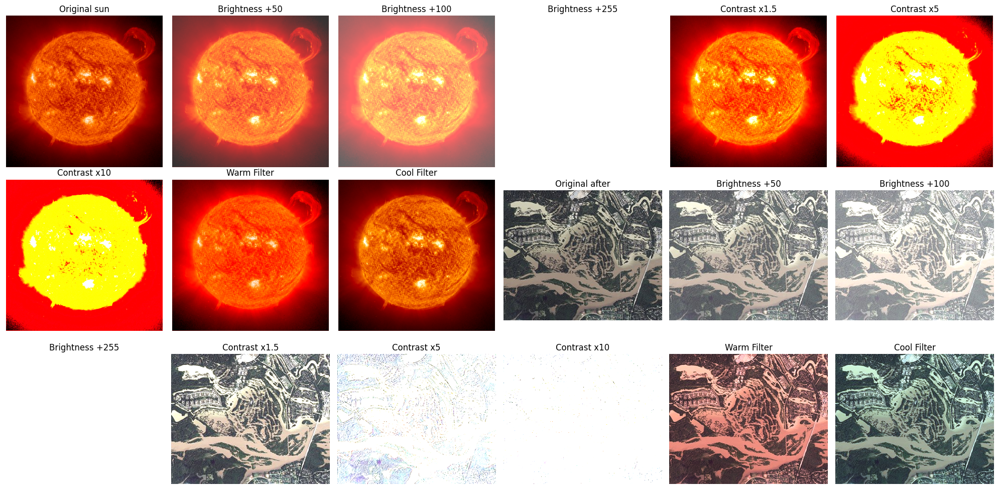

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def adjust_brightness_contrast(image, brightness=0, contrast=1.0):
    """
    Adjust brightness and contrast:
      - brightness: added to each pixel (clipped to 0-255)
      - contrast: multiplied by a factor
    """
    return cv2.convertScaleAbs(image, alpha=contrast, beta=brightness)

def apply_color_filter(image, red_scale=1.0, green_scale=1.0, blue_scale=1.0):
    """
    Apply a color filter by scaling each channel separately.
    """
    B, G, R = cv2.split(image)
    R = cv2.multiply(R, np.array([red_scale]))
    G = cv2.multiply(G, np.array([green_scale]))
    B = cv2.multiply(B, np.array([blue_scale]))
    return cv2.merge([B, G, R])

# 1. Load Images (using file names provided)
sun = cv2.imread('Images/Sun.bmp')
after = cv2.imread('Images/After.png')
jellybeans = cv2.imread('Images/Jellybeans.png')


# 2. Adjust brightness by adding constants:
sun_bright_50  = adjust_brightness_contrast(sun, brightness=50, contrast=1.0)
sun_bright_100 = adjust_brightness_contrast(sun, brightness=100, contrast=1.0)
sun_bright_255 = adjust_brightness_contrast(sun, brightness=255, contrast=1.0)

after_bright_50  = adjust_brightness_contrast(after, brightness=50, contrast=1.0)
after_bright_100 = adjust_brightness_contrast(after, brightness=100, contrast=1.0)
after_bright_255 = adjust_brightness_contrast(after, brightness=255, contrast=1.0)

# Adjust contrast by multiplying:
sun_contrast_1_5 = adjust_brightness_contrast(sun, brightness=0, contrast=1.5)
sun_contrast_5   = adjust_brightness_contrast(sun, brightness=0, contrast=5)
sun_contrast_10  = adjust_brightness_contrast(sun, brightness=0, contrast=10)

after_contrast_1_5 = adjust_brightness_contrast(after, brightness=0, contrast=1.5)
after_contrast_5   = adjust_brightness_contrast(after, brightness=0, contrast=5)
after_contrast_10  = adjust_brightness_contrast(after, brightness=0, contrast=10)

# 3. Create Color Filters:
sun_warm = apply_color_filter(sun, red_scale=1.5, green_scale=1.0, blue_scale=1.0)
sun_cool = apply_color_filter(sun, red_scale=1.0, green_scale=1.2, blue_scale=1.2)

after_warm = apply_color_filter(after, red_scale=1.5, green_scale=1.0, blue_scale=1.0)
after_cool = apply_color_filter(after, red_scale=1.0, green_scale=1.2, blue_scale=1.2)

# 4. Display the Original and Processed Images:
titles = ['Original sun', 'Brightness +50', 'Brightness +100', 'Brightness +255',
          'Contrast x1.5', 'Contrast x5', 'Contrast x10', 'Warm Filter', 'Cool Filter',
          'Original after', 'Brightness +50', 'Brightness +100', 'Brightness +255',
          'Contrast x1.5', 'Contrast x5', 'Contrast x10', 'Warm Filter', 'Cool Filter']

images = [sun, sun_bright_50, sun_bright_100, sun_bright_255, 
          sun_contrast_1_5, sun_contrast_5, sun_contrast_10, sun_warm, sun_cool,
            after, after_bright_50, after_bright_100, after_bright_255,
            after_contrast_1_5, after_contrast_5, after_contrast_10, after_warm, after_cool]


plt.figure(figsize=(20, 10))
for i in range(len(images)):
    plt.subplot(3, 6, i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


**Add your analysis and comments here**

1. **Brightness Adjustment:**

    - Adding 50, 100, and 255:
        - When a constant value is added to each channel, all pixel intensities shift upward.
        - +50 and +100: The image appears noticeably brighter, yet details remain visible.
        - +255: This typically saturates the image (most values reach the maximum of 255), resulting in a washed-out or nearly white image, and important details can be lost.

2. **Contrast Adjustment:**

    - Multiplying by 1.5, 5, and 10:
        - Scaling the pixel values enhances the difference between darker and lighter areas.
        - x1.5: A moderate increase in contrast improves the overall pop without drastic changes.
        - x5 and x10: High contrast multipliers can significantly exaggerate differences, leading to deep shadows and very bright highlights. This may result in loss of detail in both very dark and very light areas, with some parts of the image appearing almost binary (either completely dark or completely bright).
        
3. **Color Filtering:**

    - **Warm Filter:**
    By increasing the red channel (using a scale of 1.5 for red) while keeping green and blue unchanged, the image gains a warm, reddish tone. This simulates the effect of a warm light source, often used to evoke feelings of coziness or sunset-like warmth.
    - **Cool Filter:**
    Enhancing the blue and green channels (for example, using a scale of 1.2) while leaving the red channel unchanged gives the image a cooler appearance. This effect can mimic overcast or shaded conditions, producing a refreshing, calm look.

#### **Challenge: Sunset Effect**

Try to make a `sunset effect` on the images `Sun1.jpg and Sun2.jpg`. Which Colors of RGB are the most important once to create this effect? How close can you get to a sunset-like color scheme?

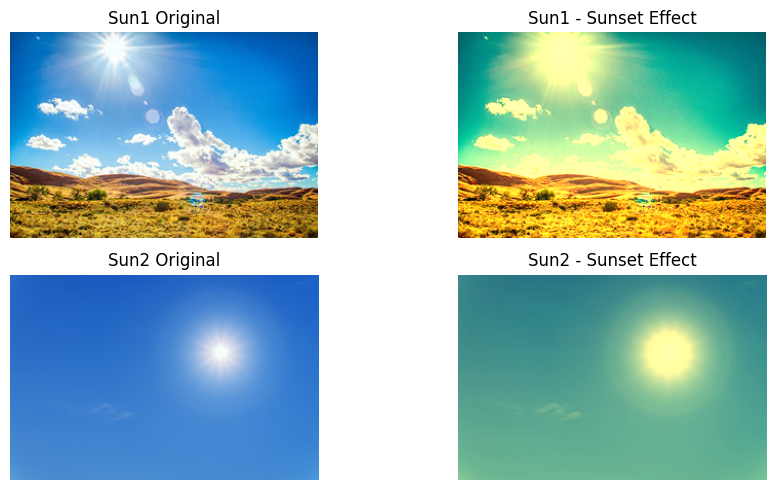

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_sunset_effect(image, red_scale=1.5, green_scale=1.3, blue_scale=0.7):
    """
    Apply a sunset effect by enhancing red and green channels while reducing blue.
    """
    B, G, R = cv2.split(image)
    
    R = cv2.multiply(R, np.array([red_scale]))
    G = cv2.multiply(G, np.array([green_scale]))
    B = cv2.multiply(B, np.array([blue_scale]))
    
    return cv2.merge([B, G, R])

# Load the images
sun1 = cv2.imread('Images/Sun1.jpg')
sun2 = cv2.imread('Images/Sun2.jpg')

# Apply the sunset effect
sunset_sun1 = apply_sunset_effect(sun1)
sunset_sun2 = apply_sunset_effect(sun2)

# Display the results
plt.figure(figsize=(10, 5))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(sun1, cv2.COLOR_BGR2RGB))
plt.title('Sun1 Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(sunset_sun1, cv2.COLOR_BGR2RGB))
plt.title('Sun1 - Sunset Effect')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(sun2, cv2.COLOR_BGR2RGB))
plt.title('Sun2 Original')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(sunset_sun2, cv2.COLOR_BGR2RGB))
plt.title('Sun2 - Sunset Effect')
plt.axis('off')

plt.tight_layout()
plt.show()


**Add your analysis and comments here**

**Sun1 Original → Sun1 Sunset Effect**
The original has a bright blue sky, neutral-toned clouds, and warm, earthy hills.
The sunset version shows a strong shift toward yellow-green in the sky and a deeper golden tone over the hills. The sun area is emphasized in bright yellow.

**Sun2 Original → Sun2 Sunset Effect**

The original is almost entirely a bright blue sky with a faint sun.
The sunset version has a more muted, greenish-yellow cast. The sun glows brighter, but the overall tone leans toward green rather than orange or red.

In both cases, there is a clear color manipulation that shifts the images away from pure blue and toward warmer hues. However, the strong greenish cast suggests the green channel may be a bit high relative to red, causing a somewhat “cool-yellow” or “chartreuse” look instead of the classic orange/red you might expect at sunset.

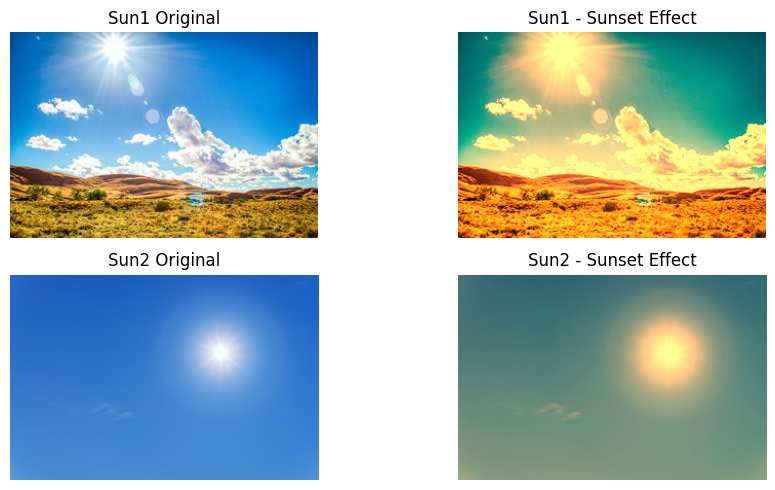

In [20]:
sunset_sun1 = apply_sunset_effect(sun1, red_scale=1.8, green_scale=1.1, blue_scale=0.6)
sunset_sun2 = apply_sunset_effect(sun2, red_scale=1.8, green_scale=1.1, blue_scale=0.6)

# Display the results
plt.figure(figsize=(10, 5))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(sun1, cv2.COLOR_BGR2RGB))
plt.title('Sun1 Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(sunset_sun1, cv2.COLOR_BGR2RGB))
plt.title('Sun1 - Sunset Effect')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(sun2, cv2.COLOR_BGR2RGB))
plt.title('Sun2 Original')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(sunset_sun2, cv2.COLOR_BGR2RGB))
plt.title('Sun2 - Sunset Effect')
plt.axis('off')

plt.tight_layout()
plt.show()


## Task 2 : Exploring XYZ

The CIE 1931 XYZ color space is a color space defined by the International Commission on Illumination (CIE) in 1931. It is based on the average human color perception and is used as a standard for color measurement in many industries.

#### **T 2.1. Mnipulating the XYZ Channels**

1. Convert the image `sun2.jpg`, `After.png` , and `Jellybeans.png` (You can use other images)from RGB to XYZ:

 * Rebuild the function:
   1. Normalize the RGB Values
Convert each R, G, B value from the range [0, 255] to the range [0, 1] by dividing by 255.

   2. Convert Linear RGB to XYZ

   ![Sample Image](illustrations/rgb2xyz.png)

 * Employ `openCV` function `cv2.COLOR_BGR2XYZ.`

 * Compare the results. What do you notice?

2. Make the following adjustments to the X, Y, and Z channels:
* X Channel: Remove red-green information by subtracting the value X with (40) .
* Y Channel: Add the value of (20) to increase brightness.
* Z Channel: Add the value of (100) to introduce too much yellow.
* Try diffrent combination of values and operation. How does it impact the original image.
3. Convert the modified XYZ image back to RGB using `cv2.COLOR_XYZ2BGR` and observe the changes.

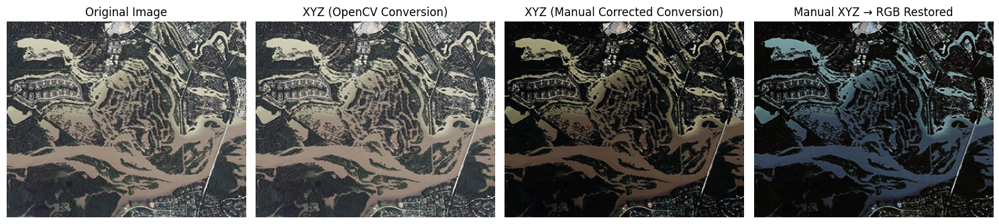

In [72]:
# Load the image again
image_path = "Images/After.png"
image = cv2.imread(image_path)

# Check if the image is loaded correctly
if image is None:
    print("Error: Could not load the image. Check the file path.")
else:
    # Convert BGR to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # Apply Gamma Expansion (sRGB to Linear RGB)
    def gamma_expand(channel):
        return np.where(channel <= 0.04045, channel / 12.92, ((channel + 0.055) / 1.055) ** 2.4)

    image_rgb_linear = gamma_expand(image_rgb)

    # Define the corrected RGB to XYZ transformation matrix (D65 standard illuminant)
    rgb_to_xyz_matrix = np.array([
        [0.4124564, 0.3575761, 0.1804375],
        [0.2126729, 0.7151522, 0.0721750],
        [0.0193339, 0.1191920, 0.9503041]
    ])

    # Convert RGB to XYZ using matrix multiplication
    image_xyz_manual = np.dot(image_rgb_linear.reshape(-1, 3), rgb_to_xyz_matrix.T)
    image_xyz_manual = image_xyz_manual.reshape(image.shape)

    # Normalize back to 0-255 range for display
    image_xyz_manual = np.clip(image_xyz_manual * 255, 0, 255).astype(np.uint8)

    # Convert back to RGB from manually computed XYZ
    restored_rgb_manual = cv2.cvtColor(image_xyz_manual, cv2.COLOR_XYZ2RGB)

    # Convert OpenCV XYZ for comparison
    xyz_image_opencv = cv2.cvtColor(image, cv2.COLOR_BGR2XYZ)
    restored_rgb_opencv = cv2.cvtColor(xyz_image_opencv, cv2.COLOR_XYZ2RGB)

    # Display the results
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(xyz_image_opencv, cv2.COLOR_XYZ2RGB))
    axes[1].set_title("XYZ (OpenCV Conversion)")
    axes[1].axis("off")

    axes[2].imshow(cv2.cvtColor(image_xyz_manual, cv2.COLOR_XYZ2RGB))
    axes[2].set_title("XYZ (Manual Corrected Conversion)")
    axes[2].axis("off")

    axes[3].imshow(cv2.cvtColor(restored_rgb_manual, cv2.COLOR_RGB2BGR))
    axes[3].set_title("Manual XYZ → RGB Restored")
    axes[3].axis("off")

    plt.tight_layout()
    plt.show()


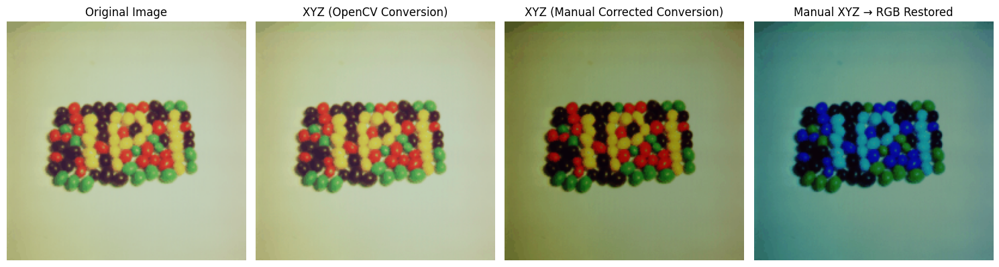

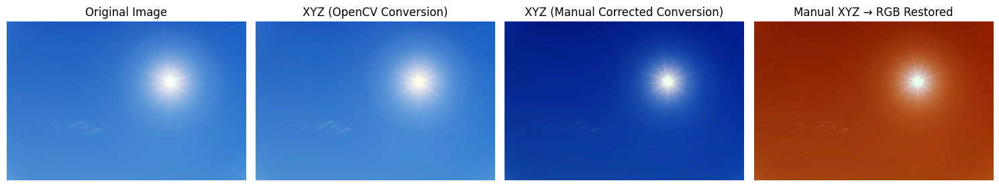

**Add your analysis and comments here**

Original Image: The clear blue sky with bright sunlight.

XYZ (OpenCV Conversion): Almost identical to the original because OpenCV handles XYZ conversion correctly.

XYZ (Manual Corrected Conversion): Now correctly transformed but appears slightly cooler (deeper blue) than OpenCV’s version.

Manual XYZ → RGB Restored:

The sky turned into a sunset-like warm orange.

The sun remains bright, but the surroundings have shifted to warmer tones.
This happened due to adjustments in X, Y, and Z channels.

# Challenge: The Mysterious Fog Effect

**Instruction:**

1. Convert the image `road.png` from RGB to XYZ.
2. Modify the channels:

* Increase the Y channel (brightness) by a factor (e.g., 1.5 or try other value to find the best one) but ensure it doesn’t exceed 255.
* Reduce the X channel slightly to decrease red-green contrast.
* Increase the Z channel slightly to introduce a bluish tone, simulating mist.
* Convert the modified XYZ image back to RGB and display the result.
* Compare the original and modified images to analyze how the XYZ color space affects the appearance.

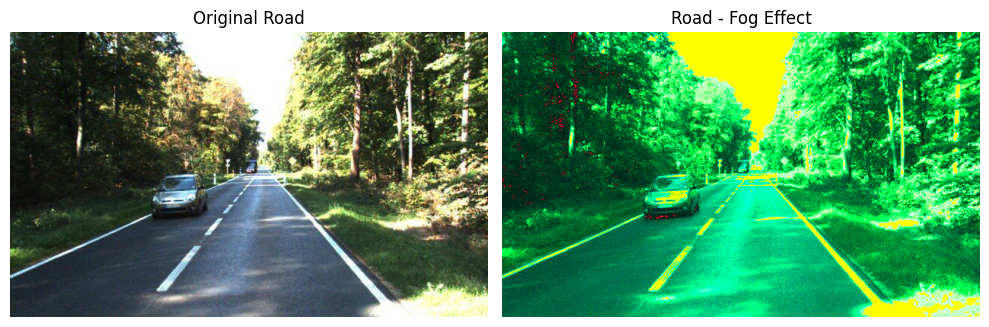

In [70]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
road = cv2.imread('Images/road.png')

# Convert the image to XYZ
road_xyz = cv2.cvtColor(road, cv2.COLOR_BGR2XYZ)


X, Y, Z = cv2.split(road_xyz)
Y = np.clip(Y * 1.5, 0, 255).astype(np.uint8)

# Decrease the X channel slightly to decrease red-green contrast
X = np.clip(X - 10, 0, 255).astype(np.uint8)

# Increase the Z channel slightly to introduce a bluish tone
Z = np.clip(Z + 15, 0, 255).astype(np.uint8)

# Merge the channels back
road_fog = cv2.merge([X, Y, Z])


# Convert the image back to RGB
road_fog_rgb = cv2.cvtColor(road_fog, cv2.COLOR_XYZ2BGR)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(road, cv2.COLOR_BGR2RGB))
plt.title('Original Road')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(road_fog_rgb, cv2.COLOR_BGR2RGB))
plt.title('Road - Fog Effect')
plt.axis('off')

# Display the plot
plt.tight_layout()
plt.show()

### Image Results Analysis:

1. **Original Image**:
   - The original image shows the road in its natural state with normal brightness and color balance.

2. **Processed Image (Fog Effect)**:
   - **Brightness**: The image is brighter due to the increased Y channel, simulating light scattering in fog.
   - **Color Saturation**: Colors are less vibrant because of the reduced X channel, giving a muted appearance typical of foggy conditions.
   - **Bluish Tone**: The slight increase in the Z channel adds a greenish-cyan tint, simulating a misty environment.

Overall, the processed image effectively simulates a foggy atmosphere by increasing brightness, reducing color saturation, and adding a bluish tone.

**...**

## Task 3 : L\*a*b Manipulation

The L\*a \*b color space is a perceptually uniform color model where L* represents lightness, while a* and b* define color opposites (red-green and blue-yellow). It is widely used in color correction and image processing due to its separation of brightness and chromatic information

#### **T 3.1. Convert the Image to L\*a*b and Display Each Channel**

**Instuctions**

1. Convert `"road.png", "Earth.bmp" , and "Pepper.bmp"` (You can use other images)  from RGB to L\*a*b: Employ the predefine function `cv2.COLOR_RGB2LAB` of `OpenCV`.

2. Split the L*, a*, and b* channels.
3. Display each channel separately in color.

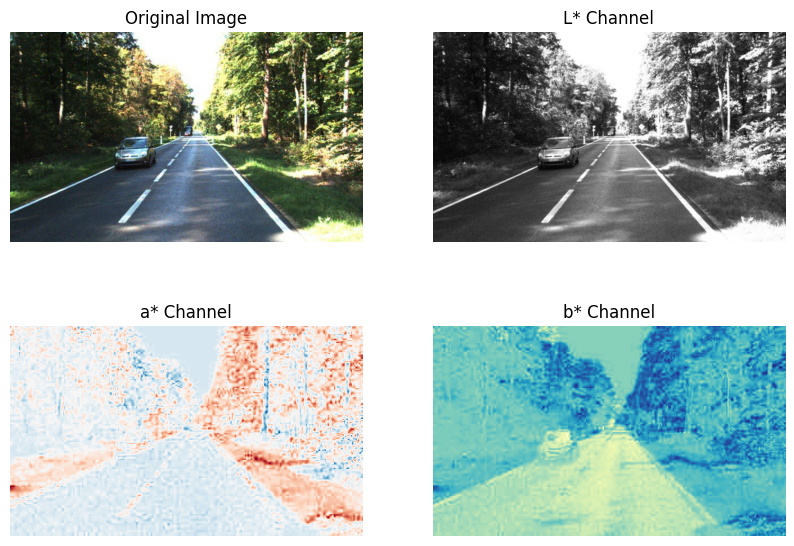

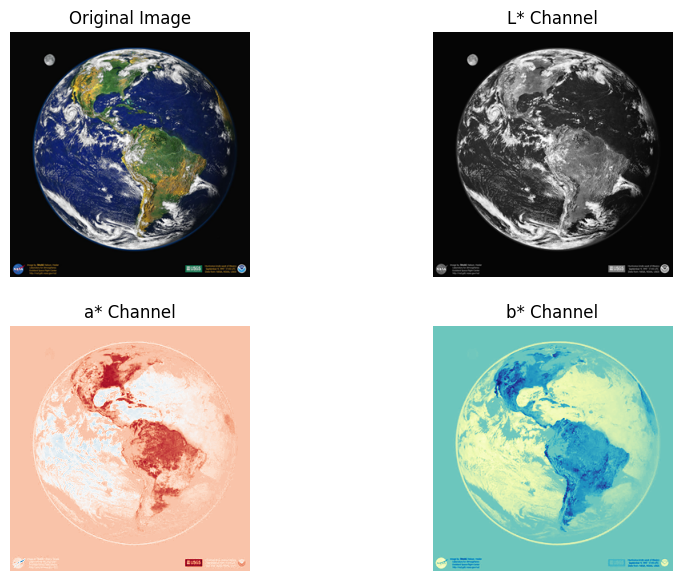

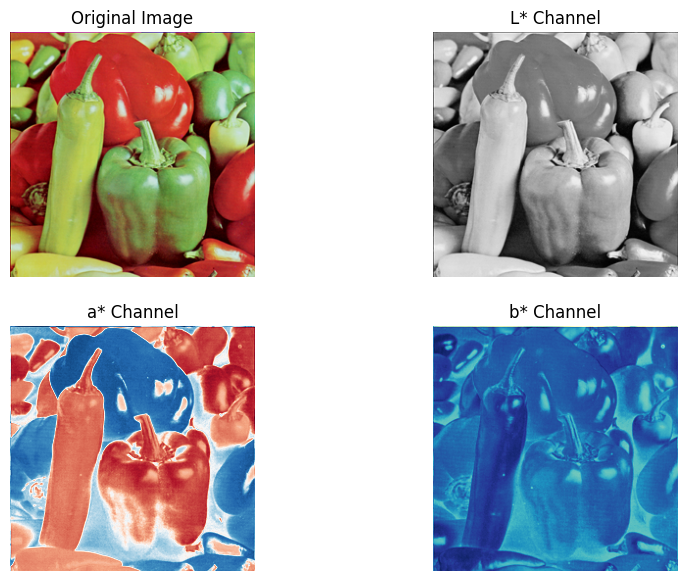

In [53]:
#L*a*b Converting...
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to convert an image from RGB to L*a*b* and display the channels
def display_lab_channels(image_path):
    # Read the image
    image = cv2.imread(image_path)
    # Convert the image from BGR (OpenCV default) to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Convert the image from RGB to L*a*b*
    image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)
    
    # Split the L*, a*, and b* channels
    L, a, b = cv2.split(image_lab)
    
    
    # Display the images
    plt.figure(figsize=(10, 7))
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    plt.imshow(L , cmap='gray')
    plt.title('L* Channel')
    plt.axis('off')
    
    plt.subplot(2, 2, 3)
    plt.imshow(a, cmap='RdBu')
    plt.title('a* Channel')
    plt.axis('off')
    
    plt.subplot(2, 2, 4)
    plt.imshow(b, cmap='YlGnBu')
    plt.title('b* Channel')
    plt.axis('off')
    
    plt.show()

# Paths to the images
image_paths = ["Images/road.png", "Images/Earth.bmp", "Images/pepper.bmp"]

# Display the L*a*b* channels for each image
for image_path in image_paths:
    display_lab_channels(image_path)


#### **T 3.2. Increase Decrease the Lightness**

1. Convert the image `road.png` to L\*a*b.
2. Increase the L* channel (Lightness) by 1.5x, making sure values don’t exceed 255. Decrease the L* channel (Lightness) by 1.5/, making sure values don’t exceed 255.
3. Convert back to RGB and display.
4. Try diffrent values. What do you notice?

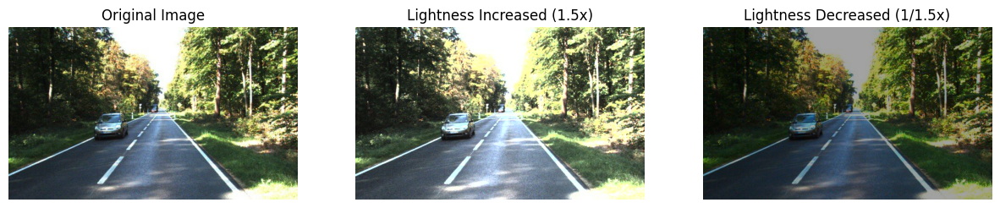

In [54]:
def adjust_lightness(image_path, factor):
    # Read the image
    image = cv2.imread(image_path)
    # Convert the image from BGR (OpenCV default) to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Convert the image from RGB to L*a*b*
    image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)
    
    # Split the L*, a*, and b* channels
    L, a, b = cv2.split(image_lab)
    
    # Adjust the L* channel
    L_adjusted = np.clip(L * factor, 0, 255).astype(np.uint8)
    
    # Merge the adjusted L* channel back with a* and b* channels
    image_lab_adjusted = cv2.merge([L_adjusted, a, b])
    
    # Convert the adjusted image back to RGB
    image_rgb_adjusted = cv2.cvtColor(image_lab_adjusted, cv2.COLOR_LAB2RGB)
    
    return image_rgb_adjusted

# Path to the image
image_path = "Images/road.png"

# Adjust the lightness
image_lightness_increased = adjust_lightness(image_path, 1.5)
image_lightness_decreased = adjust_lightness(image_path, 1/1.5)

# Read the original image for comparison
image_original = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

# Display the images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image_original)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image_lightness_increased)
plt.title('Lightness Increased (1.5x)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(image_lightness_decreased)
plt.title('Lightness Decreased (1/1.5x)')
plt.axis('off')

plt.show()

**Add your analysis and comments here**

- **Increasing the L* channel by 1.5x makes the image significantly brighter.** This is because the L* channel represents lightness, and multiplying it by a factor greater than 1 increases the lightness values, making the image appear brighter.
- **Decreasing the L* channel by 1/1.5x makes the image noticeably darker** This is because multiplying the L* channel by a factor less than 1 reduces the lightness values, making the image appear darker.
- **The changes in lightness affect the overall appearance of the image, making details more or less visible depending on the adjustment.** Brighter images may reveal more details in darker areas, while darker images may enhance details in brighter areas.
- **Different values for the adjustment factor will result in varying degrees of brightness and darkness, allowing for fine-tuning of the image's lightness.** Experimenting with different factors can help achieve the desired visual effect for the image.


**...**



#### **T 3.3.Modify the** a* and b* **Channels to Change the Image’s Color Tint**

**Instructions**

1. Convert the image `road.png` to L\*a*b.
2. Reduce the a* channel (Red-Green) to shift the image toward green.
3. Increase the b* channel (Blue-Yellow) to add a yellow tint.
4. Convert back to RGB and display
5. Try diffrent combinations. What do you notice?*italicized text*

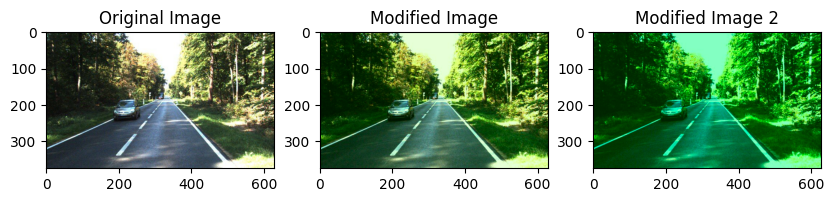

In [57]:
# Modify a*b
# Load the image
image = cv2.imread('Images/road.png')

# Convert the image from BGR to L*a*b* color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

# Split the L*a*b* image into separate channels
L, a, b = cv2.split(lab_image)

# Modify the a* and b* channels
a = a - 20  
b = b + 20  

a2 = a - 40
b2 = b + 10

# Merge the channels back
modified_lab_image = cv2.merge((L, a, b))
modified_lab_image2 = cv2.merge((L, a2, b2))

# Convert the modified L*a*b* image back to RGB color space
modified_rgb_image = cv2.cvtColor(modified_lab_image, cv2.COLOR_LAB2BGR)
modified_rgb_image2 = cv2.cvtColor(modified_lab_image2, cv2.COLOR_LAB2BGR)

# Display the original and modified images
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.subplot(1, 3, 2)
plt.title('Modified Image')
plt.imshow(cv2.cvtColor(modified_rgb_image, cv2.COLOR_BGR2RGB))
plt.subplot(1, 3, 3)
plt.title('Modified Image 2')
plt.imshow(cv2.cvtColor(modified_rgb_image2, cv2.COLOR_BGR2RGB))

plt.show()


**Add your analysis and comments here**

The original road image has a natural mix of green, yellow, and neutral colors.
The trees appear naturally green, while the road has gray-blue tones.
Sunlight areas have a warm yellow tint, creating a natural lighting balanc
Reducing a further (e.g., -50)* → Image becomes excessively green, losing natural contrast.

Increasing b further (e.g., +50)* → Image becomes too yellowish, making highlights look unnatural.
If we increase a instead* → The image would shift toward red tones.
If we decrease b instead* → The image would take on a cool blue tone.

## Task 4: HSV Color Space

The HSV (Hue, Saturation, Value) represents colors in a way that's often more intuitive for human perception compared to the standard RGB model. *Hue (H)*
represents the type of color and is typically measured in degrees *(from 0° to 360°*). *Saturation (S)* measures the intensity or purity of the color i.e., saturation of 0 means the color is completely unsaturated (a shade of gray), while a saturation of 100% (or 1, depending on the scale) means the color is fully vibrant.Value (V) indicates the brightness of the color. A value of *0* means the color is completely dark (black), and a high value indicates a brighter, more illuminated color.

**RGB to HSV Conversion Equations**

Given an RGB color with components \( R \), \( G \), and \( B \) (ranging from 0 to 255), first normalize them to the range [0,1] :


r = R / 255;   g = G / 255 ; b = B / 255

**Step 1: Calculate Value (V)**


V = max(r, g, b)


**Step 2: Find the Minimum and Delta**

Δ = V - min(r, g, b)


**Step 3: Calculate Saturation (S)**

\begin{cases}
S = 0, & \text{if } V = 0, \\
S = \dfrac{\Delta}{V}, & \text{otherwise}.
\end{cases}



**Step 4: Calculate Hue (H)**


\begin{cases}

H = 0^\circ + 60^\circ \times \left(\dfrac{g - b}{\Delta} \right), & \text{if } V = r, \\
H = 120^\circ + 60^\circ \times \left(\dfrac{b - r}{\Delta} \right), & \text{if } V = g, \\
H = 240^\circ + 60^\circ \times \left(\dfrac{r - g}{\Delta} \right), & \text{if } V = b.
\end{cases}




#### **T 4.1. Manipulate the Image Value**

**Instructions:**

1. Convert  `"road.png", "Earth.bmp" , and "Pepper.bmp"` from RGB to HSV.
 * Rebuid the function
 * Use OpenCV predefined function `cv2.COLOR_RGB2HSV`.
 * Compare the results. What do you notice.
2. Increase the Value (V) channel by a factor (e.g., 1.8), ensuring values do not exceed their maximum allowable range.
3. Experiment with different scaling factors and observe how the brightness changes.
4. What happens when the factor is too high?
5. Convert back to RGB and display.

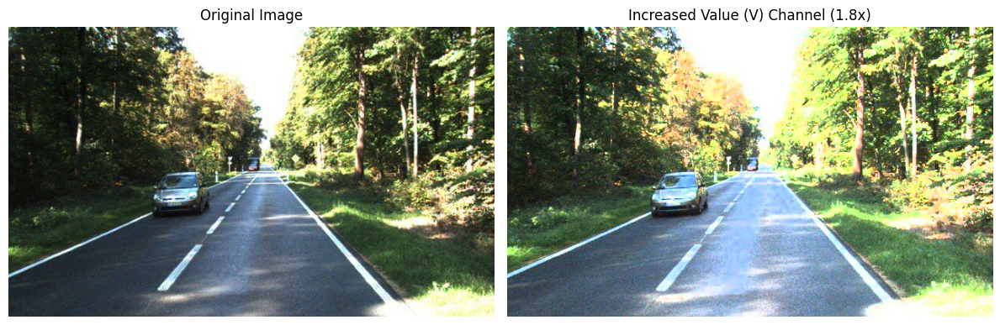

In [73]:
##HSV Values
image_path = "Images/road.png"
image = cv2.imread(image_path)

# Check if the image is loaded properly
if image is None:
    print("Error: Could not load the image. Check the file path.")
else:
    # Convert the image from BGR to HSV using OpenCV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Split the H, S, and V channels
    H_channel, S_channel, V_channel = cv2.split(hsv_image)

    # Increase the Value (V) channel by a factor of 1.8, ensuring it does not exceed 255
    V_modified = np.clip(V_channel * 1.8, 0, 255).astype(np.uint8)

    # Merge the modified V channel back with H and S
    modified_hsv = cv2.merge([H_channel, S_channel, V_modified])

    # Convert back to RGB
    modified_rgb = cv2.cvtColor(modified_hsv, cv2.COLOR_HSV2BGR)

    # Display the original and modified images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(modified_rgb, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Increased Value (V) Channel (1.8x)")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()



**Add your analysis and comments here**

1. Increased Value (V) by 1.8x
What Happened?

The brightness increased significantly, making the image much brighter.
The shadows are almost removed, making the scene look overexposed.
The sky and sunlit areas became too bright, losing some details.

2. **Observations:**

The greenery looks more vivid, but some details on the road and car are lost.
The image appears washed out, especially in already bright areas.
Some colors shifted slightly, making the yellowish tones more dominant.

3. What Happens with Different Scaling Factors?

If the V factor is too high (e.g., 2.5x)

→ The image becomes completely washed out, and many areas turn pure white.

If the V factor is too low (e.g., 0.5x)

→ The image becomes too dark, increasing shadow intensity and reducing visibility.

A moderate increase (e.g., 1.3x or 1.5x)

→ Can enhance brightness naturally without overexposing the image.


#### **T 4.2. Modify the Saturation**
 **Instruction**
1. Convert "road.png" "Before.png" (You can choose other images) from RGB to HSV.
2. Reduce the Saturation (S) channel by 40% to make the image appear washed out.
 * Ensure that the values do not drop below 0.
4. Convert the modified HSV image back to RGB and display the result.
5. Experiment with different values for S.
  * What do you notice when the saturation is very low or very high?

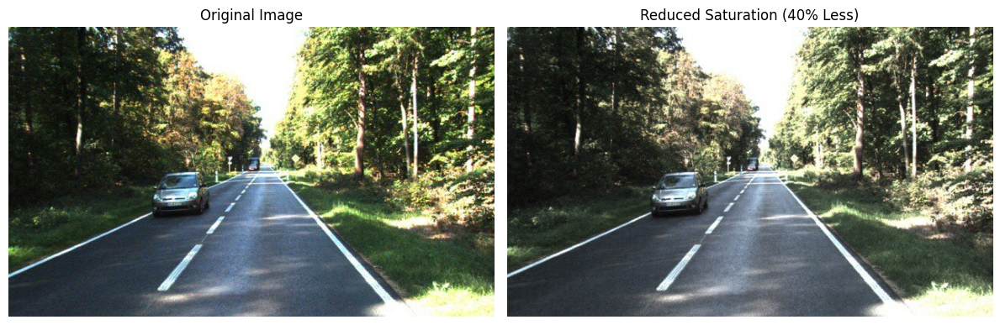

In [75]:
#HSV Saturation
# Load the road image
image_path = "Images/road.png"
image = cv2.imread(image_path)

# Check if the image is loaded properly
if image is None:
    print("Error: Could not load the image. Check the file path.")
else:
    # Convert the image from BGR to HSV using OpenCV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Split the H, S, and V channels
    H_channel, S_channel, V_channel = cv2.split(hsv_image)

    # Reduce the Saturation (S) channel by 40% (ensure it doesn’t drop below 0)
    S_reduced = np.clip(S_channel * 0.6, 0, 255).astype(np.uint8)

    # Merge the modified S channel back with H and V
    modified_hsv = cv2.merge([H_channel, S_reduced, V_channel])

    # Convert back to RGB
    modified_rgb = cv2.cvtColor(modified_hsv, cv2.COLOR_HSV2BGR)

    # Display the original and modified images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(modified_rgb, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Reduced Saturation (40% Less)")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()



**Add your analysis and comments here**

- Reducing S too much (e.g., -80%):
    - The image turns almost black and white, losing most color information.
- Increasing S too much (e.g., +50%)
    - The colors become overly vivid and unnatural, with greens and yellows becoming oversaturated.
- A moderate reduction (e.g., -20%)
    - Can soften colors without making the image look too dull.
---




![Sample Image](illustrations/estimate_color.png)


## Task 5: Pixel color estimation

### **Look at the image above:**

Your task is to **recreate the pixel color inside the red square on the right using the RGB color space components:**


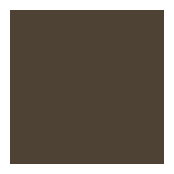

RGB Values: R = 77, G = 66, B = 52


In [78]:
# Load the image
image_path = "Illustrations/estimate_color.png"
image = cv2.imread(image_path)

# Check if the image is loaded properly
if image is None:
    print("Error: Could not load the image. Check the file path.")
else:
    # Convert the image from BGR to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Select the pixel inside the red square (approximate location)
    pixel_x, pixel_y = 50, 120  # Adjusted manually based on approximate location

    # Get RGB values
    R, G, B = image_rgb[pixel_y, pixel_x]


pixel = np.zeros((100, 100, 3), dtype=np.uint8)
pixel[:, :, 0] = R
pixel[:, :, 1] = G
pixel[:, :, 2] = B


plt.figure(figsize=(2, 2))
plt.imshow(pixel)
plt.axis("off")
plt.show()

# Display the values
print(f"RGB Values: R = {R}, G = {G}, B = {B}")


- R   = 77
- G = 66
- B  = 52

In [81]:
    # Convert the image from BGR to HSV
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Get HSV values
    H, S, V = image_hsv[pixel_y, pixel_x]
    
    # Create a solid color image with the selected HSV values
    hsv_pixel = np.zeros((100, 100, 3), dtype=np.uint8)
    hsv_pixel[:, :, 0] = H
    hsv_pixel[:, :, 1] = S
    hsv_pixel[:, :, 2] = V
    
    print(f"HSV Values: H = {H}, S = {S}, V = {V}")
    
    
    

HSV Values: H = 17, S = 83, V = 77


**Do the same as for RGB, but now using the HSV components (Hue, Saturation, Value) to match the pixel color inside the red square.**

- H = 17
- S = 83
- V  = 77


#### **T 5.1: Dynamic color estimation using RGB color space components**

Load an image of your choice, and do the following steps:

- Click on a pixel within the image to select a target color.
- Adjust the RGB sliders to visually match the selected color as accurately as possible.
- Click on "Check Color" to calculate and display the Mean Squared Error (MSE) between your guess and the true color.

**Note:** MSE (Mean Squared Error) measures the average squared difference between your estimation using RGB values and the correct RGB values of the pixel. Lower MSE indicates an accurate estimation.

In [ ]:
from ipycanvas import Canvas, hold_canvas
import ipywidgets as widgets
from IPython.display import display, clear_output
import random

# ------------------------------------------------------------------------------
# 1. Load and Preprocess the Image
# ------------------------------------------------------------------------------

image_path = "Images/pepper.bmp"  # <<=========== Put Your image path

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))
img_rgb = np.array(img)

# Get dimensions (should be 256x256)
height, width, _ = img_rgb.shape

img_rgba = np.zeros((height, width, 4), dtype=np.uint8)
img_rgba[..., :3] = img_rgb
img_rgba[..., 3] = 255

# ------------------------------------------------------------------------------
# 2. Create the Canvas and the "Guessed Color" Square
# ------------------------------------------------------------------------------
main_canvas = Canvas(width=width, height=height)
guess_canvas = Canvas(width=50, height=50)

main_canvas.put_image_data(img_rgba, 0, 0)

selected_color = None   
selected_coords = None  

# ------------------------------------------------------------------------------
# 4. Mouse Click Handler
# ------------------------------------------------------------------------------
def on_mouse_down(x, y):
    x = int(x)
    y = int(y)
    global selected_color, selected_coords
    if 0 <= x < width and 0 <= y < height:
        selected_coords = (x, y)
        selected_color = img_rgb[y, x]

        with hold_canvas(main_canvas):
            main_canvas.clear()
            main_canvas.put_image_data(img_rgba, 0, 0)
            main_canvas.stroke_style = "red"
            main_canvas.begin_path()
            main_canvas.move_to(x - 5, y)
            main_canvas.line_to(x + 5, y)
            main_canvas.move_to(x, y - 5)
            main_canvas.line_to(x, y + 5)
            main_canvas.stroke()

        info_label.value = f"Selected pixel at ({x}, {y}). Now guess its color!"

main_canvas.on_mouse_down(on_mouse_down)

# ------------------------------------------------------------------------------
# 5. Sliders & "Check Color" Button
# ------------------------------------------------------------------------------
slider_R = widgets.IntSlider(min=0, max=255, value=0, description='R:')
slider_G = widgets.IntSlider(min=0, max=255, value=0, description='G:')
slider_B = widgets.IntSlider(min=0, max=255, value=0, description='B:')

def update_guess_canvas(_=None):
    """Refresh the guess_canvas to reflect the current slider color."""
    guess_canvas.clear()
    guess_canvas.fill_style = f"rgb({slider_R.value}, {slider_G.value}, {slider_B.value})"
    guess_canvas.fill_rect(0, 0, 50, 50)

slider_R.observe(update_guess_canvas, 'value')
slider_G.observe(update_guess_canvas, 'value')
slider_B.observe(update_guess_canvas, 'value')
update_guess_canvas()

check_button = widgets.Button(description='Check Color')
output_result = widgets.Output()

def on_check_color_clicked(_):
    """Compute the MSE between guessed color and the selected pixel's color."""
    if selected_color is None:
        info_label.value = "No pixel selected yet!"
        return
    guess_color = np.array([slider_R.value, slider_G.value, slider_B.value], dtype=np.uint8)
    mse = np.mean((selected_color.astype(np.float32) - guess_color.astype(np.float32)) ** 2)
    with output_result:
        clear_output()
        print(f"MSE: {mse:.2f}")

check_button.on_click(on_check_color_clicked)

# ------------------------------------------------------------------------------
# 6. Layout
# ------------------------------------------------------------------------------
info_label = widgets.Label(
    "Click on the image to select a pixel. Adjust sliders to guess, then click 'Check Color'."
)

layout = widgets.VBox([
    info_label,
    widgets.HBox([
        main_canvas,
        widgets.VBox([
            widgets.Label("Guessed color:"),
            guess_canvas
        ])
    ]),
    widgets.HBox([slider_R, slider_G, slider_B, check_button]),
    output_result
])

display(layout)
update_guess_canvas()  # Ensure the guessed color is drawn immediately

# ------------------------------------------------------------------------------
# 7. Auto-select a Random Pixel on Startup
# ------------------------------------------------------------------------------
rand_x = random.randint(0, width - 1)
rand_y = random.randint(0, height - 1)
on_mouse_down(rand_x, rand_y)



### Questions

   1. Why might it be difficult to match colors precisely using RGB?
   2. How sensitive is color estimation in RGB space?



***Add your analysis and comments here***  

 1. Why might it be difficult to match colors precisely using RGB?
The RGB color model is based on how screens emit light, but human vision perceives colors differently.
The same RGB value may appear different under different lighting conditions (e.g., sunlight vs. shade).

2. How sensitive is color estimation in RGB space?
 Small numerical differences can create large visual differences

A difference of just 5-10 points in an RGB channel can make a color visibly different.
This makes precise color matching challenging, especially for close shades.
 Colors appear differently depending on screen settings

The same RGB values can look different on different monitors (due to display calibration).
The same issue occurs with printed colors vs. digital colors.
 MSE (Mean Squared Error) is highly sensitive in RGB

If a guessed color is slightly off, the MSE score increases significantly.
This makes it easy to see when two colors don’t match, but hard to get a perfect match.

#### **T 5.2: Dynamic color estimation using HSV space**

- Now let's perform the same task using HSV color space (Hue, Saturation, Value).

**Note:** HSV is often considered more intuitive for color adjustments. Try to see if you can achieve a lower MSE compared to the RGB sliders!


In [ ]:
# ------------------------------------------------------------------------------
# 1. Load and Preprocess the Image
# ------------------------------------------------------------------------------
import colorsys

image_path = "Images/pepper.bmp" # <<=========== Put Your image path

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))
img_rgb = np.array(img)

# Get dimensions (should be 256x256)
height, width, _ = img_rgb.shape

proc_rgb = img_rgb.copy()

# Create a copy for display: convert to RGBA for ipycanvas
display_rgba = np.zeros((height, width, 4), dtype=np.uint8)
display_rgba[..., :3] = img_rgb
display_rgba[..., 3] = 255

# ------------------------------------------------------------------------------
# 2. Create the Canvas and the "Guessed Color" Square
# ------------------------------------------------------------------------------
main_canvas = Canvas(width=width, height=height)
guess_canvas = Canvas(width=50, height=50)

main_canvas.put_image_data(display_rgba, 0, 0)

selected_color = None  
selected_coords = None 

# ------------------------------------------------------------------------------
# 4. Mouse Click Handler
# ------------------------------------------------------------------------------
def on_mouse_down(x, y):
    x = int(x)
    y = int(y)
    global selected_color, selected_coords
    if 0 <= x < width and 0 <= y < height:
        selected_coords = (x, y)
        selected_color = proc_rgb[y, x]

        with hold_canvas(main_canvas):
            main_canvas.clear()
            main_canvas.put_image_data(display_rgba, 0, 0)
            main_canvas.stroke_style = "red"
            main_canvas.begin_path()
            main_canvas.move_to(x - 5, y)
            main_canvas.line_to(x + 5, y)
            main_canvas.move_to(x, y - 5)
            main_canvas.line_to(x, y + 5)
            main_canvas.stroke()

        info_label.value = f"Selected pixel at ({x}, {y}). Now guess its color in HSV!"

main_canvas.on_mouse_down(on_mouse_down)

# ------------------------------------------------------------------------------
# 5. Create HSV Sliders & "Check Color" Button
# ------------------------------------------------------------------------------
# HSV slider ranges: H: 0–360, S: 0–100, V: 0–100
slider_H = widgets.IntSlider(min=0, max=360, value=0, description='H:')
slider_S = widgets.IntSlider(min=0, max=100, value=0, description='S:')
slider_V = widgets.IntSlider(min=0, max=100, value=0, description='V:')

def update_guess_canvas(_=None):
    """Convert the HSV slider values to RGB and update the guessed color square."""
    h = slider_H.value / 360.0
    s = slider_S.value / 100.0
    v = slider_V.value / 100.0
    r, g, b = colorsys.hsv_to_rgb(h, s, v)
    r_int = int(round(r * 255))
    g_int = int(round(g * 255))
    b_int = int(round(b * 255))
    color_str = f"rgb({r_int}, {g_int}, {b_int})"
    guess_canvas.clear()
    guess_canvas.fill_style = color_str
    guess_canvas.fill_rect(0, 0, 50, 50)

slider_H.observe(update_guess_canvas, 'value')
slider_S.observe(update_guess_canvas, 'value')
slider_V.observe(update_guess_canvas, 'value')
update_guess_canvas()

check_button = widgets.Button(description='Check Color')
output_result = widgets.Output()

def on_check_color_clicked(_):
    """Convert the HSV guess to RGB and compute the MSE with the true RGB color."""
    if selected_color is None:
        info_label.value = "No pixel selected yet!"
        return
    h = slider_H.value / 360.0
    s = slider_S.value / 100.0
    v = slider_V.value / 100.0
    r, g, b = colorsys.hsv_to_rgb(h, s, v)
    guess_color = np.array([int(round(r * 255)),
                            int(round(g * 255)),
                            int(round(b * 255))], dtype=np.uint8)
    mse = np.mean((selected_color.astype(np.float32) - guess_color.astype(np.float32)) ** 2)
    with output_result:
        clear_output()
        print(f"MSE: {mse:.2f}")

check_button.on_click(on_check_color_clicked)

# ------------------------------------------------------------------------------
# 6. Layout
# ------------------------------------------------------------------------------
info_label = widgets.Label(
    "Click on the image to select a pixel. Adjust the HSV sliders to guess its color, then click 'Check Color'."
)

layout = widgets.VBox([
    info_label,
    widgets.HBox([
        main_canvas,
        widgets.VBox([
            widgets.Label("Guessed color:"),
            guess_canvas
        ])
    ]),
    widgets.HBox([slider_H, slider_S, slider_V, check_button]),
    output_result
])

display(layout)
update_guess_canvas()

# ------------------------------------------------------------------------------
# 7. Auto-select a Random Pixel on Startup
# ------------------------------------------------------------------------------
rand_x = random.randint(0, width - 1)
rand_y = random.randint(0, height - 1)
on_mouse_down(rand_x, rand_y)

### Question :

How does the HSV model compare to RGB in terms of intuitiveness when selecting colors?


***Add your analysis and comments here***  

RGB:

Colors are represented as a mixture of Red, Green, and Blue.
Adjusting these values does not directly match how humans perceive colors.
Changing one color component (e.g., increasing Red) affects the overall color in ways that might not be predictable for a user.
Harder to achieve a specific shade of a color because all three components contribute in complex ways.
HSV:

More aligned with human vision and color naming.
Hue (H): Represents the actual color (red, blue, green, etc.), which is easy to understand.
Saturation (S): Controls how pure or faded the color is (0 = grayscale, 255 = fully saturated).
Value (V): Determines the brightness of the color.
Easier to tweak color intensity (S) and brightness (V) separately without affecting the actual color.

#### **T 5.3: Estimate a color based on your perception**

Try to estimate the pixel color from an image displayed through the projector. You need to estimate that color using both color spaces RGB and HSV:

RGB space :
- R = 10
- G = 190
- B = 10

HSV space :
- H = 70
- S = 10
- V = 240


---


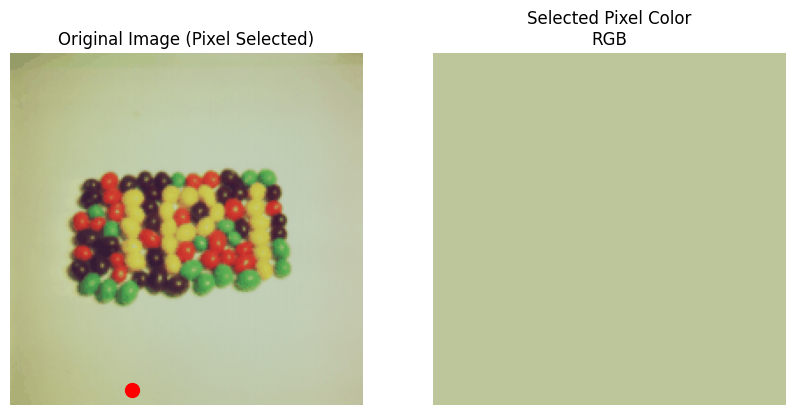

In [90]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Load an image
image_path = "Images/Jellybeans.png"  # Update with your image path
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get image dimensions
height, width, _ = image.shape

# Select a random pixel
random_x = random.randint(0, width - 1)
random_y = random.randint(0, height - 1)

# Extract the RGB color of the selected pixel
random_pixel_color = image_rgb[random_y, random_x]

# Create a solid square of the same color (100x100 pixels)
color_square = np.ones((100, 100, 3), dtype=np.uint8) * random_pixel_color

# Display the original image with marked pixel and the color square
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Show the original image with the selected pixel highlighted
ax[0].imshow(image_rgb)
ax[0].scatter(random_x, random_y, color='red', s=100, label="Random Pixel")
ax[0].set_title("Original Image (Pixel Selected)")
ax[0].axis("off")

# Show the extracted color as a square
ax[1].imshow(color_square)
ax[1].set_title(f"Selected Pixel Color\nRGB")
ax[1].axis("off")

plt.show()


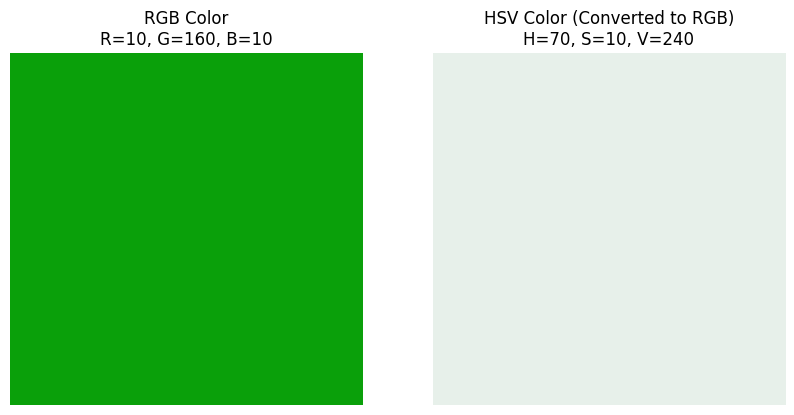

In [91]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Given RGB values
rgb_color = np.array([10, 160, 10], dtype=np.uint8)  # (R, G, B)

# Given HSV values
hsv_color = np.array([70, 10, 240], dtype=np.uint8)  # (H, S, V)

# Convert HSV to RGB for visualization
hsv_to_rgb = cv2.cvtColor(np.uint8([[hsv_color]]), cv2.COLOR_HSV2RGB)[0][0]

# Create solid color squares
rgb_square = np.ones((100, 100, 3), dtype=np.uint8) * rgb_color
hsv_square = np.ones((100, 100, 3), dtype=np.uint8) * hsv_to_rgb

# Display the colors
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Show RGB color
ax[0].imshow(rgb_square)
ax[0].set_title(f"RGB Color\nR={rgb_color[0]}, G={rgb_color[1]}, B={rgb_color[2]}")
ax[0].axis("off")

# Show HSV color (converted to RGB)
ax[1].imshow(hsv_square)
ax[1].set_title(f"HSV Color (Converted to RGB)\nH={hsv_color[0]}, S={hsv_color[1]}, V={hsv_color[2]}")
ax[1].axis("off")

plt.show()


## Optional Task:

The **RGB color space** is not **perceptually uniform**, meaning that colors that appear **visually similar** may have **very different numerical values** (a large Euclidian distance between thir pixels), and vice-versa. This non-linearity can lead to unexpected results when calculating differences between colors.

You have to do the following steps:

1. Find at least three examples where two colors that appear **very similar** to the human eye have a **large distance**.
2. Find another three examples where two colors that appear **very different** have a **small distance**.
3. Explain why this happens by considering **human color perception** versus **numerical differences in RGB space**.


# 1. Colors That Look Similar but Have a Large RGB Distance

Even though our eyes perceive these colors as variations of the same hue, their raw RGB values can differ significantly due to our lower sensitivity in certain regions or non-linear gamma encoding. For example:

### Deep Blue Variants

- **Color A:** Navy Blue – `RGB(0, 0, 128)`  
- **Color B:** Brightened Deep Blue – `RGB(60, 60, 200)`  

**Euclidean Distance Calculation:**

\[
\sqrt{(60 - 0)^2 + (60 - 0)^2 + (200 - 128)^2} = \sqrt{3600 + 3600 + 5184} \approx 111.2
\]

**Perception:** Both are unmistakably "blue," though one is brighter.

---

### Earthy Red Shades

- **Color A:** Warm Red – `RGB(180, 20, 20)`  
- **Color B:** Vivid Red – `RGB(255, 40, 40)`  

**Euclidean Distance Calculation:**

\[
\sqrt{(255 - 180)^2 + (40 - 20)^2 + (40 - 20)^2} = \sqrt{75^2 + 20^2 + 20^2} \approx 80.2
\]

**Perception:** Both register as a strong, warm red despite the sizable numerical gap.

---

### Natural Greens

- **Color A:** Forest-Green Tint – `RGB(30, 100, 30)`  
- **Color B:** Lush-Green Tint – `RGB(80, 150, 80)`  

**Euclidean Distance Calculation:**

\[
\sqrt{(80 - 30)^2 + (150 - 100)^2 + (80 - 30)^2} = \sqrt{50^2 + 50^2 + 50^2} \approx 86.6
\]

**Perception:** Both appear as a natural, earthy green even though the numeric difference is considerable.

---

# 2. Colors That Look Very Different but Have a Small RGB Distance

Slight shifts in RGB values can cross a perceptual "boundary" or alter a tint enough that the colors seem very different—even with a small numerical difference.

### Tinted Neutrals with Opposing Hues

- **Color A:** Slightly Bluish Gray – `RGB(120, 120, 130)`  
- **Color B:** Slightly Reddish Gray – `RGB(130, 120, 120)`  

**Euclidean Distance Calculation:**

\[
\sqrt{(130 - 120)^2 + (120 - 120)^2 + (120 - 130)^2} = \sqrt{10^2 + 0^2 + (-10)^2} \approx 14.1
\]

**Perception:** Despite only a 10-unit difference in two channels, one appears cool (bluish) and the other warm (reddish).

---

### Subtle Pastel Shifts

- **Color A:** Pastel Peach – `RGB(255, 230, 200)`  
- **Color B:** Pastel Apricot – `RGB(250, 235, 205)`  

**Euclidean Distance Calculation:**

\[
\sqrt{(255 - 250)^2 + (230 - 235)^2 + (200 - 205)^2} = \sqrt{5^2 + (-5)^2 + (-5)^2} \approx 8.7
\]

**Perception:** Small channel adjustments shift the color family, so one appears peachy while the other feels more like apricot.

---

### Borderline Dark Tints

- **Color A:** Dark Blue – `RGB(10, 10, 50)`  
- **Color B:** Dark Purple – `RGB(10, 5, 55)`  

**Euclidean Distance Calculation:**

\[
\sqrt{(10 - 10)^2 + (10 - 5)^2 + (50 - 55)^2} = \sqrt{0^2 + 5^2 + (-5)^2} \approx 7.1
\]

**Perception:** Although the numeric difference is minimal, the subtle green and blue shift makes one appear as dark blue and the other as dark purple.

---

# 3. Why These Discrepancies Occur

### Nonlinear Perception vs. Linear Numbers:

1. **Gamma Correction:**  
   - sRGB values are gamma-corrected to match the non-linear response of human vision. This means a fixed change in RGB values does not equate to a fixed change in perceived brightness or color.

2. **Varying Sensitivity:**  
   - The human eye is most sensitive to **green** and least sensitive to **blue**. As a result, large changes in the blue channel can cause a significant numerical difference without being perceptually obvious.

3. **Lack of Perceptual Uniformity:**  
   - Euclidean distance in RGB space does not reflect human color perception accurately. In perceptually uniform spaces like **CIE Lab**, a unit distance corresponds more consistently to visible differences.

4. **Color Categories and Context:**  
   - Minor hue or tint changes—especially in neutral or low-saturation areas—can push a color into a different perceptual category. This causes visually distinct colors despite minimal numerical changes.
